In [1]:
import numpy as np
from scipy import sparse
import scipy.sparse.linalg as splinalg
import matplotlib.pyplot as plt
from matplotlib import animation, rc

# Partial differential equations

# Electrostatics
 * Maxwell equations for electrostatics in vacuum:
$$ \mathrm{div} \, \mathbf{E} = \frac{\rho}{\epsilon_0}$$
$$ \mathrm{rot} \, \mathbf{E} = 0$$
* The second equation implies that the electrical field is conservative and can be expressed as a gradient of a potential: $\mathbf{E} = - \mathrm{grad} \, U$. So the first equation transforms into a Poisson equation:
$$ - \mathrm{div} \, \mathrm{grad} \, U \equiv - \Delta U = \frac{\rho}{\epsilon_0}$$
* If there are no charges present it transforms into a Laplace equation:
$$ \Delta U = 0$$
* Boundary conditions: e.q. potential is fixed at the boundaries.

## Numerical solution (two-dmensional)
$$U(y,x) = U(y = i \, \Delta s, x = j \, \Delta s) \Rightarrow U_{i,j}$$
* The discrete Laplace operator:
$$ \Delta \, U(y,x) \Rightarrow  \frac{U_{i,j+1} + U_{i,j-1} + U_{i+1,j} + U_{i-1,j} - 4 U_{i,j}}{\Delta s^2} + O(\Delta s^3)$$ 
* Dirichlet Boundary conditions: The potential values at the boundary remains untouched.

### The $\Delta$ operator in two dimensions is a four index operator: 
* $\Delta_{(i',j'),(i,j)}$
$$ \Delta_{(i,j),(i-1,j)} = \Delta_{(i,j),(i+1,j)} = \Delta_{(i,j),(i,j+1)} = \Delta_{(i,j),(i,j-1)} = \frac{1}{\Delta s^2}$$
$$ \Delta_{(i,j),(i,j)} = - \frac{4}{\Delta s^2}$$
* The problem is that in each programming language there are very efficient one and two index matrix routines but the four index ones are terribly slow. So we will always use two index routines!
*  We have to make a two index operator from $\Delta$, so we convert the $i,j$ coordinates to $x$:
$$ x(i,j) = i \times L + j,$$
where $L$ is the size of the lattice in the $i$ direction.

#### For simplicity we use $\Delta s = 1$.

## Discrete realization
Frist we implement a discrete sequential realization. In this solution we iterate through the system in random order and solve the equation locally. The random order is important, as order includes biases in the direction of the information spreading and can be much slower than random one:

Rendom order means that information about boundaries and charges diffuses as a random walk, which is in one dimension 4 times faster than trawelling against the direction of the sweep.

In [2]:

L = 50
u = np.zeros((L,L))
u[0] += 1
for t in range(1000):
    xl = np.arange((L-2)*(L-2))
    np.random.shuffle(xl)
    for x in xl:
        i = x//(L-2) + 1
        j = x % (L-2) + 1
        u[i,j] += ((u[i-1,j]+u[i+1,j]+u[i,j-1]+u[i,j+1])-4*u[i,j])*0.25

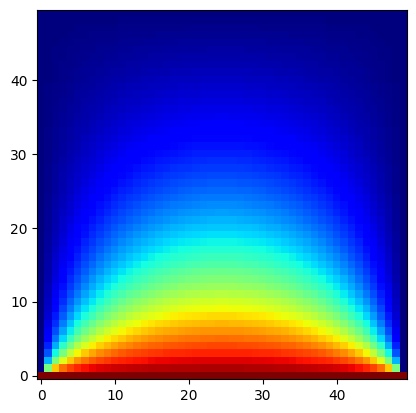

In [3]:
plt.imshow(u,origin='lower',cmap='jet')
plt.show()

### 2d Matrix realization

In [4]:
L = 50
Delta = np.zeros([L*L,L*L])      # We store Delta as a two index matrix
for i in range(L):
    for j in range(L):
        Delta[L*i+j,L*i+j] = - 4.
        if i != 0:
            Delta[L*i+j,L*(i-1)+j] = 1.
        if i != L-1:
            Delta[L*i+j,L*(i+1)+j] = 1.
        if j != 0:
            Delta[L*i+j,L*i+j-1] = 1.
        if j != L-1:
            Delta[L*i+j,L*i+j+1] = 1.

In [5]:
print(Delta)

[[-4.  1.  0. ...  0.  0.  0.]
 [ 1. -4.  1. ...  0.  0.  0.]
 [ 0.  1. -4. ...  0.  0.  0.]
 ...
 [ 0.  0.  0. ... -4.  1.  0.]
 [ 0.  0.  0. ...  1. -4.  1.]
 [ 0.  0.  0. ...  0.  1. -4.]]


## Boundaries

If we have a square system, than boundaries can be easily implemented with other methods. Here we want to create a method which works for any type of boundaries. Let us collect the points of the lattice in two vectors: $\mathbf{u}_a$ for the active and $\mathbf{u}_p$ the boundary (perimeter) sites.
$$ U_{i,j} \rightarrow \left( \begin{array}{c} \mathbf{u}_a \\ \mathbf{u}_p \end{array} \right)$$ 
The Laplace equation for the two sets of points:
$$\mathbf{\mathbf{\Delta}} \left( \begin{array}{c} \mathbf{u}_a \\ \mathbf{u}_p \end{array} \right) = \left( \begin{array}{c} \mathbf{0} \\ ? \end{array} \right),$$
Where the problem is that we do not know what is the effect of the Laplace operator at the boundaries. So we should transform it out. Let us rewrite the equation:
$$ \mathbf{\mathbf{\Delta}} \left( \begin{array}{c} \mathbf{u}_a \\ \mathbf{0} \end{array} \right) = - \mathbf{\mathbf{\Delta}} \left( \begin{array}{c} \mathbf{0} \\ \mathbf{u}_p \end{array} \right) + \left( \begin{array}{c} \mathbf{0} \\ ? \end{array} \right)$$
We create a projection to the active positions
$$ {\mathbf{\mathbf{P}}\,}_a \left( \begin{array}{c} \mathbf{u}_a \\ \mathbf{u}_p \end{array} \right) = \mathbf{u}_a$$
The equation for $\mathbf{u}_a$:
$$ {\mathbf{\mathbf{P}}\,}_a \, \mathbf{\mathbf{\Delta}} \, {\mathbf{\mathbf{P}}\,}_a^T \, \mathbf{u}_a = - {\mathbf{\mathbf{P}}\,}_a \, \mathbf{\mathbf{\Delta}} \,\left( \begin{array}{c} \mathbf{0} \\ \mathbf{u}_p \end{array} \right) $$


## The projection to the active sites
The first index is for the active sites the second is for the original lattice.

In [6]:
Proj_a = np.zeros([L*L,L*L]) # The first index will be smaller but at first we do not know by what amount
count_a = 0 # This will reference the active sites
for i in range(L):
    for j in range(L):
        if i == 0 or i == L-1 or j == 0 or j == L-1:
            continue
        Proj_a[count_a,L*i+j] = 1.
        count_a += 1
Proj_a = Proj_a[:count_a,:] # now we resize the projection array

### The boundary conditions
Let us have potential equal to 1 only on one side of the domain and 0 elwhere: $U(0,x) = 1$, and $U(y,0) = U(y,L) = U(L,x) = 0$.

Notation: $\mathbf{w} = \left( \begin{array}{c} \mathbf{0} \\ \mathbf{u}_p \end{array} \right)$ 

In [7]:
w = np.zeros(L*L)
for i in range(L):
    for j in range(L):
        if i == 0:
            w[i*L+j] = 1.

## The solution of the equation
$$\mathbf{\mathbf{M}} \, \mathbf{u}_a = \mathbf{b}$$
where

$$\begin{align} M &={\mathbf{\mathbf{P}}\,}_a \, \mathbf{\mathbf{\Delta}} \, {\mathbf{\mathbf{P}}\,}_a^T \cr
\mathbf{b}& = - {\mathbf{\mathbf{P}}\,}_a \, \mathbf{\mathbf{\Delta}} \mathbf{w}
\end{align}$$

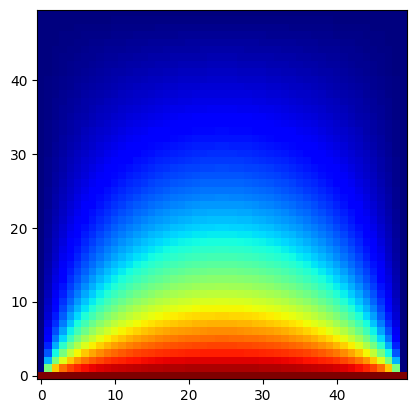

In [8]:
M = Proj_a.dot(Delta.dot(Proj_a.T))    
b = -Proj_a.dot(Delta.dot(w))         
u_a = np.linalg.solve(M,b)
u = (Proj_a.T).dot(u_a) + w  # We transfer the result back to the lattice space and add the boundary conditions                   
u = u.reshape([L,L])
plt.imshow(u,origin='lower',cmap='jet')
plt.show()

### Electric field

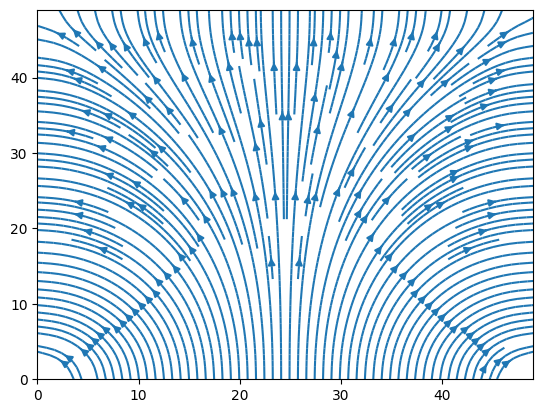

In [9]:
E_x = np.zeros([L,L])
E_y = np.zeros([L,L])
X,Y = np.meshgrid(np.arange(0,L),np.arange(0,L))
for i in range(1,L-1):
    for j in range(1,L-1):
        E_x[i,j] = -(u[i,j+1]-u[i,j-1])/2.
        E_y[i,j] = -(u[i+1,j]-u[i-1,j])/2.
plt.streamplot(X,Y,E_x,E_y,density=2.0)
plt.show()

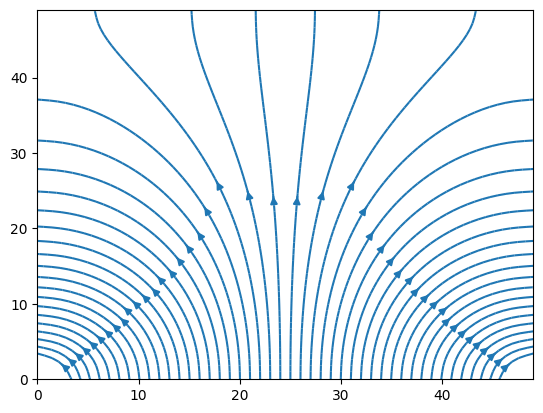

In [10]:
plt.streamplot(X,Y,E_x,E_y,
               start_points=np.array([[i,1] for i in range(1,L-1,1)]),density=2)
plt.show()

In [11]:
def field_line_plot(u,density=2.0,start_points = None):
    L = u.shape[0];
    if start_points is None:
        start_points = np.array([[i,1] for i in range(1,L-1,1)])
    E_x = np.zeros([L,L])
    E_y = np.zeros([L,L])
    X,Y = np.meshgrid(np.arange(0,L),np.arange(0,L))
    for i in range(1,L-1):
        for j in range(1,L-1):
            E_x[i,j] = -(u[i,j+1]-u[i,j-1])/2.
            E_y[i,j] = -(u[i+1,j]-u[i-1,j])/2.
    plt.streamplot(X,Y,E_x,E_y,density=density,start_points=start_points)
    plt.show()
    return
    

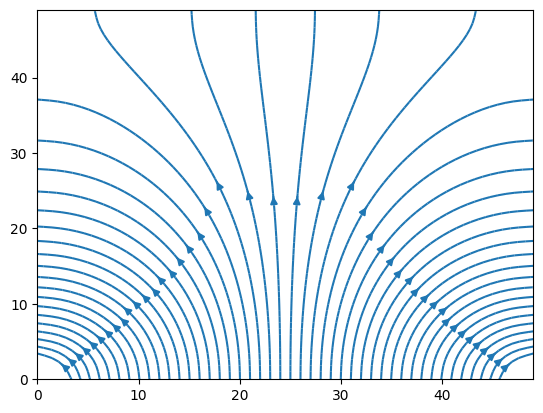

In [12]:
field_line_plot(u)

## L shaped domain
The aim of this choice of active node handling was that we can solve for arbitrary shaped system.

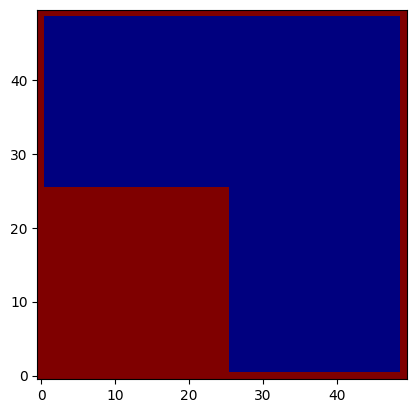

In [28]:
L = 50
B = np.zeros((L,L),dtype=int)
for i in range(L):
    for j in range(L):
        if i == 0 or i == L-1 or j == 0 or j == L-1 or (j <= L/2 and i <= L/2):
            B[i,j] = 1
plt.imshow(B,cmap='jet',origin='lower')

In [21]:
### Projection matrix
Proj_a = np.zeros([L*L,L*L])
count_a = 0
for i in range(L):
    for j in range(L):
        if i == 0 or i == L-1 or j == 0 or j == L-1 or (j <= L/2 and i <= L/2):
            continue
        Proj_a[count_a,L*i+j] = 1.
        count_a += 1
Proj_a = Proj_a[:count_a,:]

In [22]:
### Itt adja meg a w vektorban a peremfeltételeket 
w = np.zeros(L*L)
for i in range(L):
    for j in range(L):
        if i == 0 and j > L/2:
            w[i*L+j] = -1.
        if j == 0 and i > L/2:
            w[i*L+j] = +1.

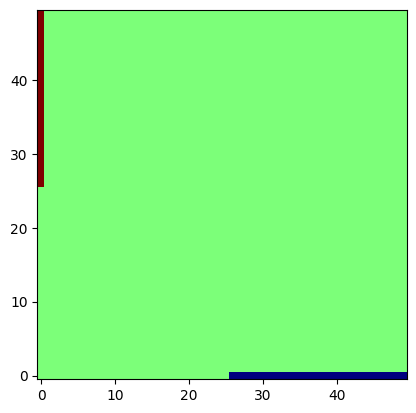

In [29]:
plt.imshow(w.reshape(L,L),cmap='jet',origin='lower')

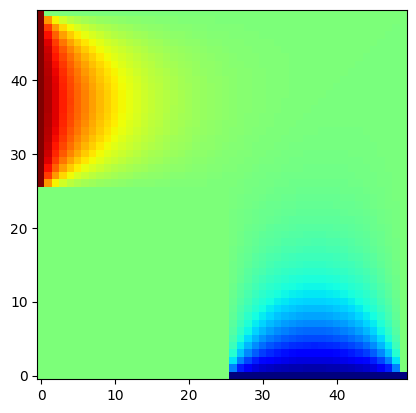

In [32]:
#Solution of the differential equation
M = Proj_a.dot(Delta.dot(Proj_a.T))   
b = -Proj_a.dot(Delta.dot(w))          
u_a = np.linalg.solve(M,b)
u = (Proj_a.T).dot(u_a) + w             
u = u.reshape([L,L])
plt.imshow(u,origin='lower',cmap='jet')
plt.show()

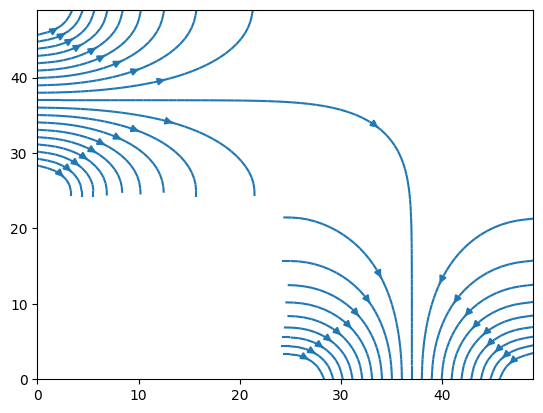

In [34]:
field_line_plot(u,start_points=np.array([[i,1] for i in range(L//2,L-1,1)] + [[1,i] for i in range(L//2,L-1,1)]))

## Sparse matrices
The problem is that matrix operations get slow with increasing system size. However most of the operations are multiplied by 0 since the $\Delta$ matrix is full of 0. Let us use the sparse matrix functions.

The sparse matrices can be stored in different ways and the page <a href="https://docs.scipy.org/doc/scipy/reference/sparse.html">https://docs.scipy.org/doc/scipy/reference/sparse.html</a> lists all of them. Fortunately the general matrix operations are the same functions so we can even experiment with the storing method.
Some formats are better optimized for successive filling up, others for matrix operations. They can be easily converted to eachother.


In [41]:
%%timeit
L = 20
Delta_sparse = sparse.csr_matrix((L*L,L*L),dtype='float')     
# 'LIL' matrix: good for filling up the matrix
for i in range(L):      
    for j in range(L):                                                      
        Delta_sparse[L*i+j,L*i+j] = - 4.
        if i != 0:
            Delta_sparse[L*i+j,L*(i-1)+j] = 1.
        if i != L-1:
            Delta_sparse[L*i+j,L*(i+1)+j] = 1.
        if j != 0:
            Delta_sparse[L*i+j,L*i+j-1] = 1.
        if j != L-1:
            Delta_sparse[L*i+j,L*i+j+1] = 1.
            
Proj_a_sparse = sparse.csr_matrix((L*L,L*L),dtype='float')
count_a = 0
for i in range(L):
    for j in range(L):
        if i == 0 or i == L-1 or j == 0 or j == L-1:
            continue
        Proj_a_sparse[count_a,L*i+j] = 1.
        count_a += 1
Proj_a_sparse = Proj_a_sparse[:count_a,:]

449 ms ± 27.5 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [46]:
%%timeit
L = 20
Delta_sparse = sparse.lil_matrix((L*L,L*L),dtype='float')     
# 'LIL' matrix: good for filling up the matrix
for i in range(L):      
    for j in range(L):                                                      
        Delta_sparse[L*i+j,L*i+j] = - 4.
        if i != 0:
            Delta_sparse[L*i+j,L*(i-1)+j] = 1.
        if i != L-1:
            Delta_sparse[L*i+j,L*(i+1)+j] = 1.
        if j != 0:
            Delta_sparse[L*i+j,L*i+j-1] = 1.
        if j != L-1:
            Delta_sparse[L*i+j,L*i+j+1] = 1.
            
Proj_a_sparse = sparse.lil_matrix((L*L,L*L),dtype='float')
count_a = 0
for i in range(L):
    for j in range(L):
        if i == 0 or i == L-1 or j == 0 or j == L-1:
            continue
        Proj_a_sparse[count_a,L*i+j] = 1.
        count_a += 1
Proj_a_sparse = Proj_a_sparse[:count_a,:]

3.95 ms ± 373 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [47]:
w = np.zeros(L*L)
for i in range(L):
    for j in range(L):
        if i == 0:
            w[i*L+j] = 1.

In [52]:
L = 300
Delta_sparse = sparse.lil_matrix((L*L,L*L),dtype='float')     
# 'LIL' matrix: 
for i in range(L):      
    for j in range(L):                                                      
        Delta_sparse[L*i+j,L*i+j] = - 4.
        if i != 0:
            Delta_sparse[L*i+j,L*(i-1)+j] = 1.
        if i != L-1:
            Delta_sparse[L*i+j,L*(i+1)+j] = 1.
        if j != 0:
            Delta_sparse[L*i+j,L*i+j-1] = 1.
        if j != L-1:
            Delta_sparse[L*i+j,L*i+j+1] = 1.

Proj_a_sparse = sparse.lil_matrix((L*L,L*L),dtype='float')
count_a = 0
for i in range(L):
    for j in range(L):
        if i == 0 or i == L-1 or j == 0 or j == L-1:
            continue
        Proj_a_sparse[count_a,L*i+j] = 1.
        count_a += 1
Proj_a_sparse = Proj_a_sparse[:count_a,:]

In [53]:
%%timeit
M = Proj_a_sparse.dot(Delta_sparse.dot(Proj_a_sparse.T))    
b = -Proj_a_sparse.dot(Delta_sparse.dot(w))          
u_a = splinalg.spsolve(M,b)
u = (Proj_a_sparse.T).dot(u_a) + w   

2.36 s ± 591 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [54]:
Delta_sparse = sparse.csr_matrix(Delta_sparse)
Proj_a_sparse = sparse.csr_matrix(Proj_a_sparse)

In [55]:
%%timeit
M = Proj_a_sparse.dot(Delta_sparse.dot(Proj_a_sparse.T))    
b = -Proj_a_sparse.dot(Delta_sparse.dot(w))          
u_a = splinalg.spsolve(M,b)
u = (Proj_a_sparse.T).dot(u_a) + w   

2.66 s ± 321 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


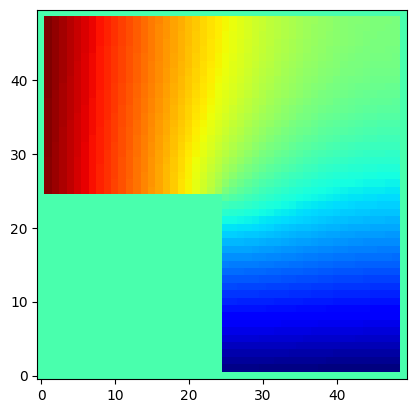

In [74]:
u = u.reshape([L,L])
plt.imshow(u,origin='lower',cmap='jet')
plt.show()

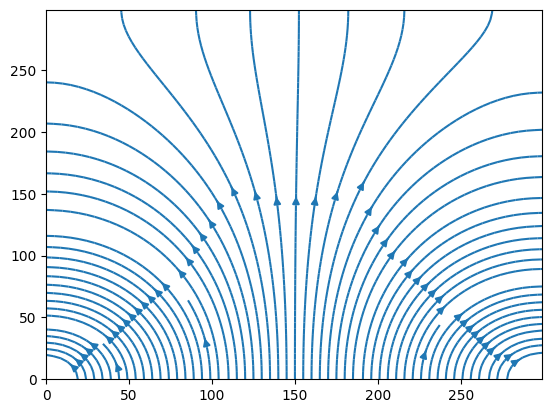

In [59]:
field_line_plot(u,density=2)

## Neumann boundary conditions
* Stacionary currents
* The time dependent parts are zero
$$ \mathrm{div} \, \mathbf{j} = 0 $$
$$ \mathrm{rot} \, \mathbf{E} = 0 $$
* Differential Ohm's law
$$ \mathbf{j} = \sigma \, \mathbf{E} \Rightarrow \mathrm{div} \, \mathbf{ \sigma E} = 0$$
* Which gives us the equations of the electrostatics
$$ \mathbf{E} = - \nabla U$$
* The boundary conditions are different:
* Where the current cannot flow: $j_{\bot} = 0$.
* In all other places we have to fix $j_{\bot}$ at the boundary. This is the Neumann boundary condition.
* Let us note again that we only prescribe the normal component of the current.

Let us take $\sigma = 1$ and $\Delta s = 1$!


### Realization of the Neumann boundary conditions
* If the wall is perpendicular to $x$: $\partial_x U(y,0) = \frac{U_{i,1}-U_{i,0}}{\Delta s}$ is given
* If the wall is perpendicular to $y$: $\partial_y U(0,x) = \frac{U_{1,j}-U_{0,j}}{\Delta s}$ is given
$$ \Delta \, U(y,x) \Rightarrow  \frac{U_{i,j+1} + U_{i,j-1} + U_{i+1,j} + U_{i-1,j} - 4 U_{i,j}}{\Delta s^2}$$
* What shall we do at the boundary?
  - e.g. $ j=j_{\max}$
    $$\begin{align}
    \frac{U_{i,j_{\max}+1} + U_{i,j_{\max}-1} + U_{i+1,j_{\max}} + U_{i-1,j_{\max}} - 4 U_{i,j_{\max}}}{\Delta s^2} &=
    \frac{U_{i,j_{\max}-1} + U_{i+1,j_{\max}} + U_{i-1,j_{\max}} - 3 U_{i,j_{\max}}}{\Delta s^2} + \frac{U_{i,j_{\max}+1} - U_{i,j_{\max}}}{\Delta s^2} =\\
    &= \frac{U_{i,j_{\max}-1} + U_{i+1,j_{\max}} + U_{i-1,j_{\max}} - 3 U_{i,j_{\max}}}{\Delta s^2} + \frac{1}{\Delta s} b^{(j_{\max})}_i
    \end{align}$$
  - In the corner e.g. $j = j_{\max}$, $i = i_{\min}$
    $$\begin{align}
    \frac{U_{i_\min,j_{\max}+1} + U_{i_\min,j_{\max}-1} + U_{i_\min+1,j_{\max}} + U_{i_\min-1,j_{\max}} - 4 U_{i_\min,j_{\max}}}{\Delta s^2} =&\frac{U_{i_\min,j_{\max}-1} + U_{i_\min+1,j_{\max}} - 2 U_{i_\min,j_{\max}}}{\Delta s^2} + \\
    &+\frac{U_{i_\min,j_{\max}+1} - U_{i,j_{\max}}}{\Delta s^2} + \frac{U_{i_\min-1,j_{\max}} - U_{i_\min,j_{\max}}}{\Delta s^2}
    \end{align}$$
 * The boundary cell is simply removed from the $\Delta$ operator.

We again create a mask for the boundaries
* active ones (bulk) $\rightarrow 1$, inactive ones (boundary) $\rightarrow 0$
* We create a mask operator
* We creatye a Delta operator using this mask


In [60]:
L = 50
mask = np.zeros(L*L,dtype='int')
for i in range(L):
    for j in range(L):
        if i == 0 or i == L-1 or j == 0 or j == L-1:
            mask[L*i + j] = 0
        else:
            mask[L*i + j] = 1

In [62]:
def Delta_masked_Neumann(L,mask):
    Delta_sparse = sparse.lil_matrix((L*L,L*L),dtype='float')     
    for i in range(L):
        for j in range(L):
            if mask[i*L+j] == 1:
                Delta_sparse[L*i+j,L*i+j] = - float(mask[(i-1)*L+j] + mask[(i+1)*L+j] + mask[i*L + j + 1] + mask[i*L + j - 1])
                Delta_sparse[L*i+j,L*(i-1)+j] = float(mask[L*(i-1)+j])
                Delta_sparse[L*i+j,L*(i+1)+j] = float(mask[L*(i+1)+j])
                Delta_sparse[L*i+j,L*i+j-1] = float(mask[L*i+j-1])
                Delta_sparse[L*i+j,L*i+j+1] = float(mask[L*i+j+1])
    Delta_sparse = sparse.csr_matrix(Delta_sparse)
    count_a = 0
    Proj_a_sparse = sparse.lil_matrix((L*L,L*L),dtype='float')   
    for i in range(L):
        for j in range(L):
            if mask[L*i+j] == 1:
                Proj_a_sparse[count_a,L*i+j] = 1.
                count_a += 1
    Proj_a_sparse = Proj_a_sparse[:count_a,:]
    Proj_a_sparse = sparse.csr_matrix(Proj_a_sparse)
    M = Proj_a_sparse.dot(Delta_sparse.dot(Proj_a_sparse.T))  
    return M, Proj_a_sparse

The current goes into the system at $U(0,L/2)$ and leaves at $U(L,L/2)$ with unit strength.

In [63]:
w = np.zeros(L*L)
for i in range(L):
    for j in range(L):
        if i == 1 and j == L//2:
            w[i*L+j] = +1
        if i == L-2 and j == L//2:
            w[i*L+j] = -1

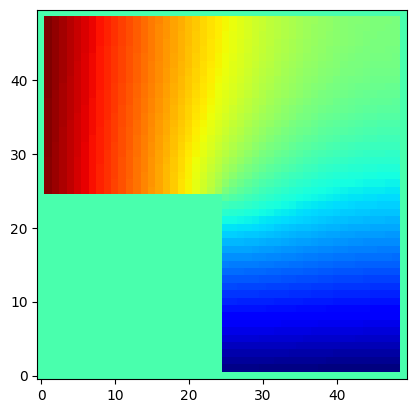

In [73]:
M, Proj_a_sparse =  Delta_masked_Neumann(L,mask) 
b = -Proj_a_sparse.dot(w)                                 
u_a = splinalg.spsolve(M,b)
u = (Proj_a_sparse.T).dot(u_a).reshape([L,L])
plt.imshow(u,origin='lower',cmap='jet')
plt.show()

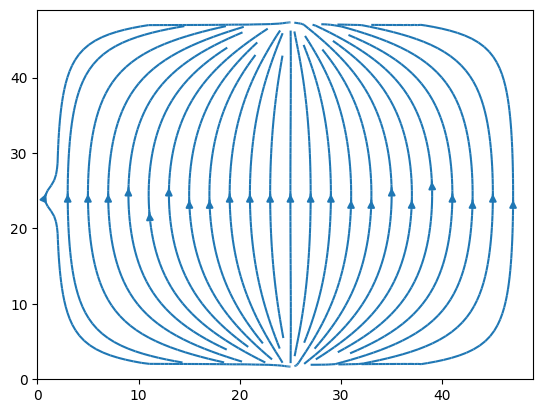

In [65]:
field_line_plot(u,start_points=np.array([[i,L//2] for i in range(1,L-1,2)]),density=2)

### Resistance
$$ R = U/I$$
* $I = 1$ all current
* $U = U(0,L/2) - U(L,L/2)$

In [67]:
R = (u[1,(L)//2]- u[L-2,(L)//2])/1.
print(R) # The real resistance
R = (u[2,(L)//2]- u[L-2,(L)//2])/1.
print(R)    #just one site away and it is already much different!

2.8215099172388025
2.4576540838453083


### Same with the L shaped cell

In [68]:
L = 50
mask = np.zeros(L*L,dtype='int')
for i in range(L):
    for j in range(L):
        if i == 0 or i == L-1 or j == 0 or j == L-1 or (j< L//2 and i < L//2):
            mask[L*i + j] = 0
        else:
            mask[L*i + j] = 1

In [69]:
Delta_sparse, Proj_a_sparse = Delta_masked_Neumann(L,mask);

In [70]:
# Boundary conditions
w = np.zeros(L*L)
for i in range(L):
    for j in range(L):
        if i == 1 and j >= L//2:
            w[i*L+j] = -1
        if i >=L//2 and j == 1:
            w[i*L+j] = +1

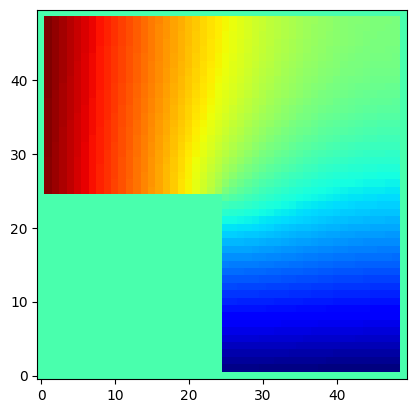

In [72]:
M, Proj_a_sparse =  Delta_masked_Neumann(L,mask) 
b = -Proj_a_sparse.dot(w)                                 
u_a = splinalg.spsolve(M,b)
u = (Proj_a_sparse.T).dot(u_a).reshape([L,L])
plt.imshow(u,origin='lower',cmap='jet')
plt.show()

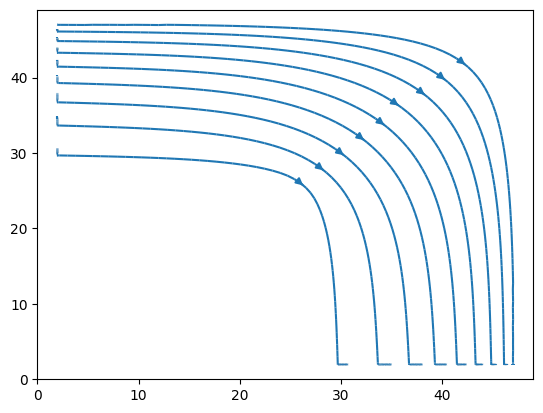

In [31]:
field_line_plot(u,start_points=np.array([[i,i] for i in range(L//2+1,L-6,2)]))

In [75]:
# Resistance
I = L/2     #j = 1 current density in  L/2 wide input
U = (u[(3*L)//4,1]- u[1,(3*L)//4])
R = U/I
print(R)
U = (u[(3*L)//4+1,1]- u[1,(3*L)//4])   #On site away
R = U/I
print(R)    #hardly any change, well conditioned system

2.4230421856018634
2.4244407571735227


# Standing wave

* Wave equation ($c = 1$):
$$ \partial_{t}^2 U(t,x,y) = \Delta U(t,x,y)$$
* The time dependence can be factored out by using the assumption $U(t,y,x) = T(t) U_{\omega}(x,y)$
$$ T^{-1}(t) \partial_{t}^2 T(t) = U_{\omega}^{-1}(x,y)\Delta U_{\omega}(x,y)$$
* The two sides depend on different variables so they must be constant. The solution of the left hand is: $T(t)= e^{i \omega t}$
$$ \Delta U_{\omega}(y,x) = - \omega^2 U_{\omega}(y,x)$$
* Ez egy sajátértékegyenlet. Oldjuk meg Dirichlet-peremfeltétel mellett! Legyenek a perem-pontok U = 0-hoz rögzítve!


## Numerical solution
$$ - \mathbf{\mathbf{P}}_a \, \mathbf{\mathbf{\Delta}} \, \mathbf{\mathbf{P}}_a^T \, \mathbf{u}_a = \omega^2 \mathbf{u}_a $$
$$ - \mathbf{\mathbf{P}}_a \, \mathbf{\mathbf{\Delta}} \, \mathbf{\mathbf{P}}_a^T \Rightarrow \mathbf{\mathbf{M}}$$

In [77]:
L = 100
mask = np.zeros(L*L,dtype='int')
for i in range(L):
    for j in range(L):
        if i == 0 or i == L-1 or j == 0 or j == L-1:
            mask[L*i + j] = 0
        else:
            mask[L*i + j] = 1

In [78]:
def Delta_masked_Dirichlet(L,mask):
    Delta_sparse = sparse.lil_matrix((L*L,L*L),dtype='float')   
    for i in range(L):
        for j in range(L):
            if mask[i*L+j] == 1:
                Delta_sparse[L*i+j,L*i+j] = - 4.     
                Delta_sparse[L*i+j,L*(i-1)+j] = 1.
                Delta_sparse[L*i+j,L*(i+1)+j] = 1.
                Delta_sparse[L*i+j,L*i+j-1] = 1.
                Delta_sparse[L*i+j,L*i+j+1] = 1.
    Delta_sparse = sparse.csr_matrix(Delta_sparse)
    
    count_a = 0
    Proj_a_sparse = sparse.lil_matrix((L*L,L*L),dtype='float')  
    for i in range(L):
        for j in range(L):
            if mask[L*i+j] == 1:
                Proj_a_sparse[count_a,L*i+j] = 1.
                count_a += 1
    Proj_a_sparse = Proj_a_sparse[:count_a,:]
    Proj_a_sparse = sparse.csr_matrix(Proj_a_sparse)
    M = - Proj_a_sparse.dot(Delta_sparse.dot(Proj_a_sparse.T))
    return M, Proj_a_sparse

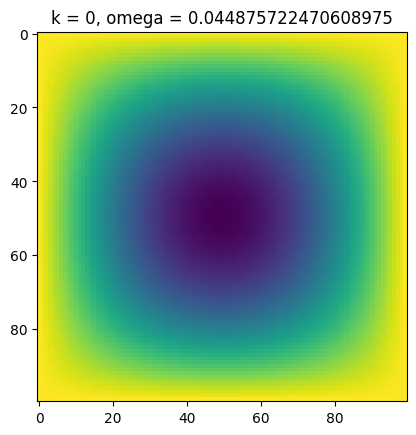

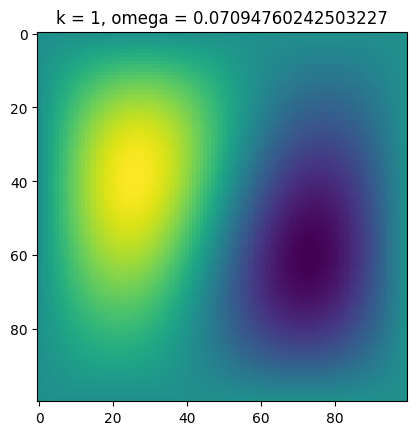

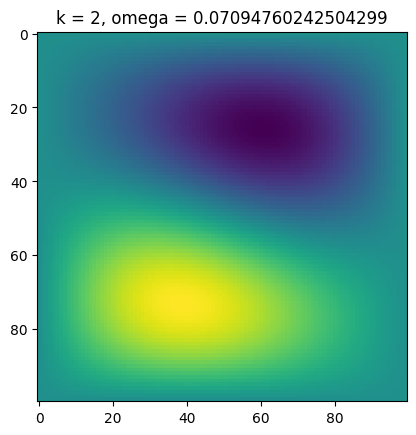

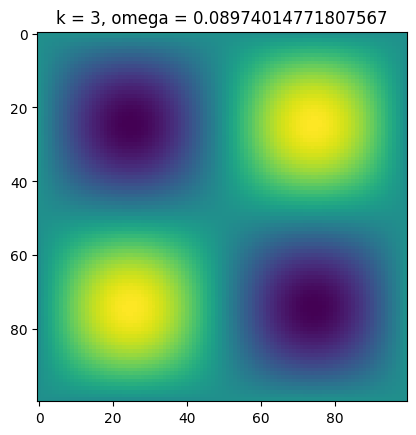

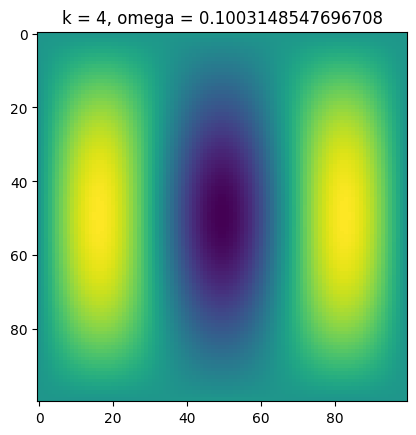

...

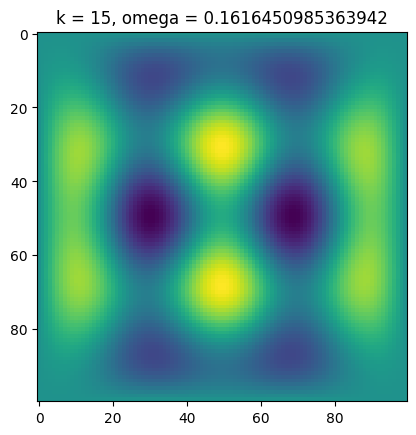

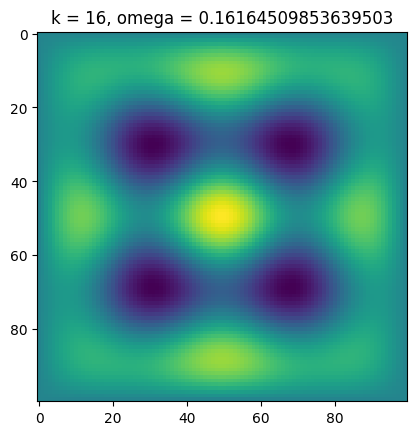

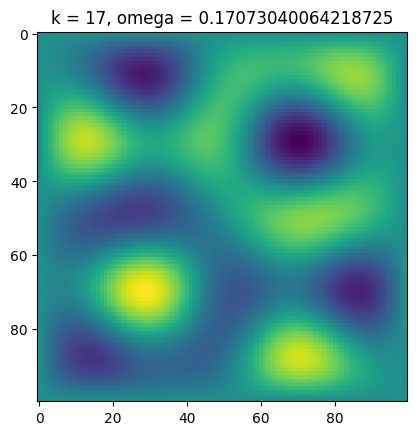

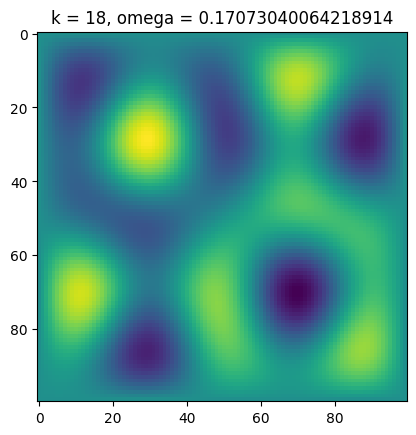

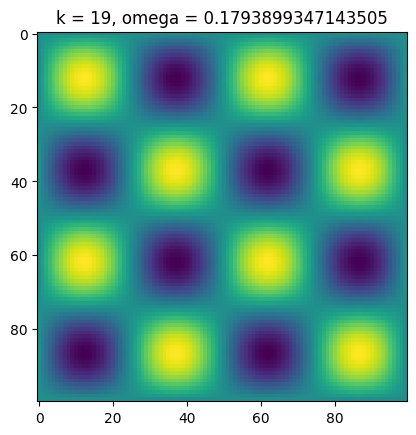

In [79]:
M, Proj_a_sparse = Delta_masked_Dirichlet(L,mask)
w,v = splinalg.eigsh(M,k=20,which='SA')
for k in range(20):
    plt.imshow(Proj_a_sparse.T.dot(v[:,k]).reshape(L,L))
    plt.title('k = ' + str(k)+ ', omega = ' + str(np.sqrt(w[k])) )
    plt.show()
    


### The L shaped domain

In [80]:
L = 100
mask = np.zeros(L*L,dtype='int')
for i in range(L):
    for j in range(L):
        if i == 0 or i == L-1 or j == 0 or j == L-1 or (j <L/2 and i < L/2):
            mask[L*i + j] = 0
        else:
            mask[L*i + j] = 1

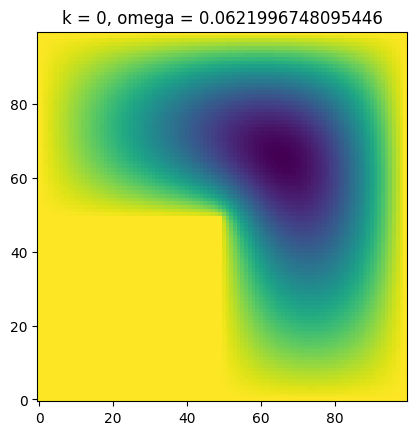

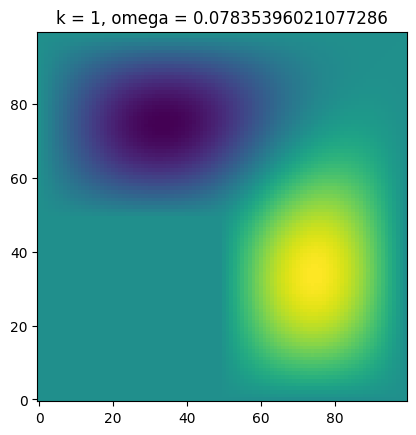

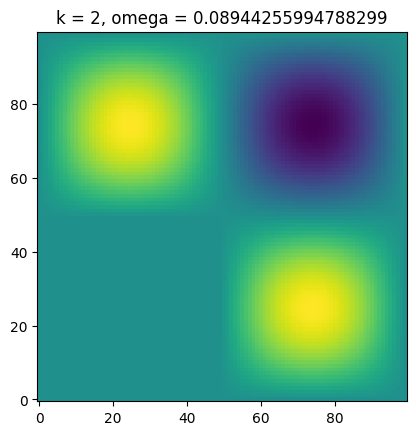

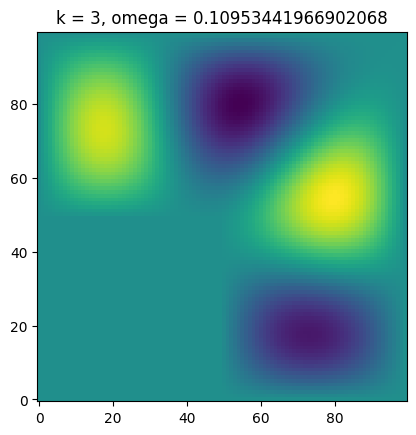

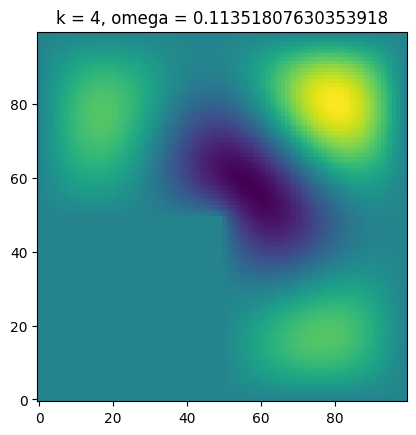

...

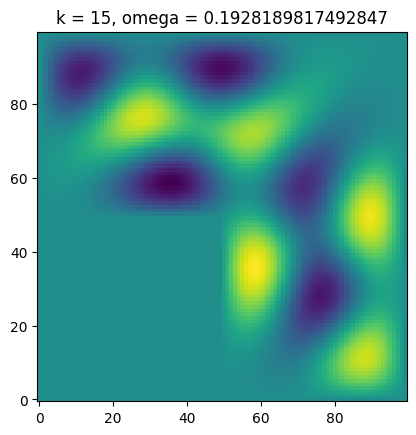

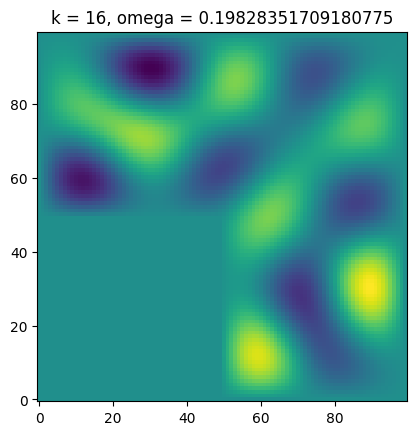

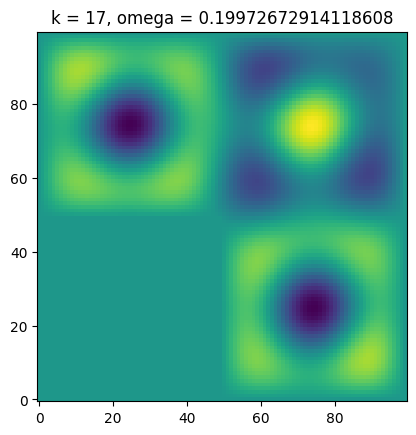

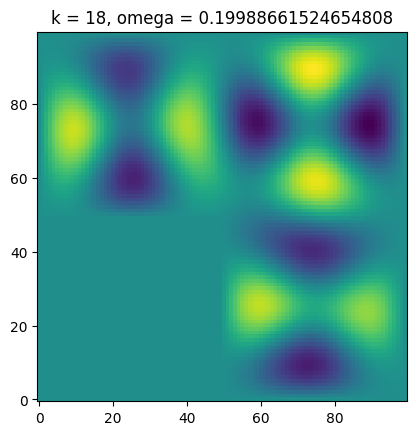

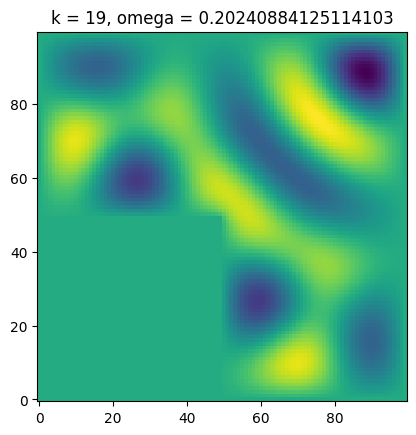

In [81]:
M, Proj_a_sparse = Delta_masked_Dirichlet(L,mask)
w,v = splinalg.eigsh(M,k=20,which='SA')
for k in range(20):
    plt.imshow(Proj_a_sparse.T.dot(v[:,k]).reshape(L,L),origin='lower')
    plt.title('k = ' + str(k)+ ', omega = ' + str(np.sqrt(w[k])) )
    plt.show()

### Spherical domain

In [82]:
L = 100
mask = np.zeros(L*L,dtype='int')
for i in range(L):
    for j in range(L):
        if (i-L/2)**2 + (j-L/2)**2 > (L//2-4)**2:
            mask[L*i + j] = 0
        else:
            mask[L*i + j] = 1

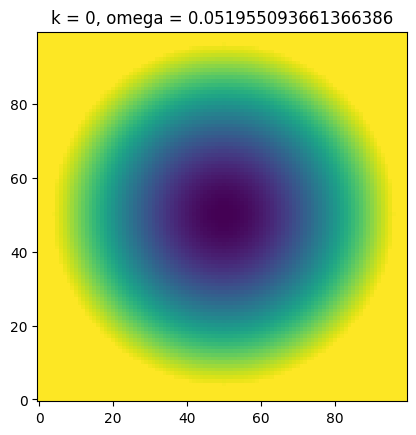

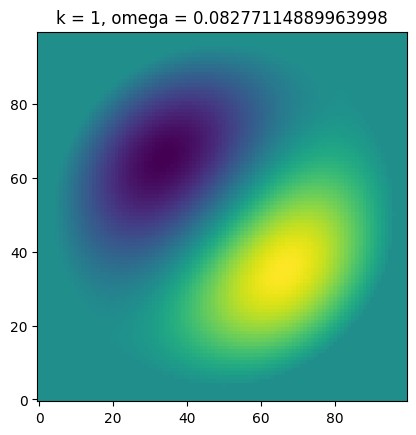

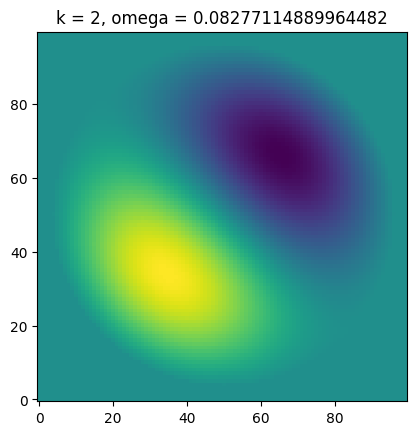

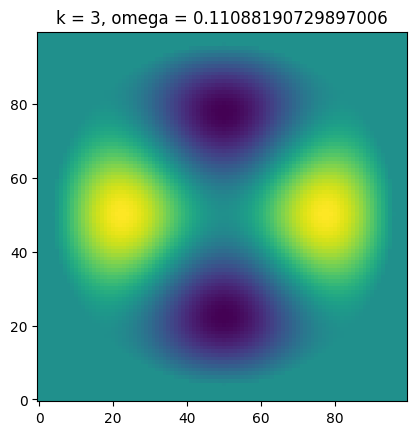

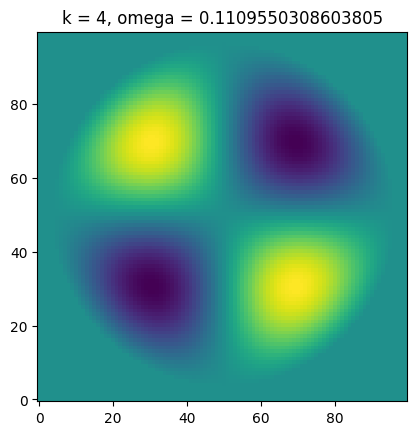

...

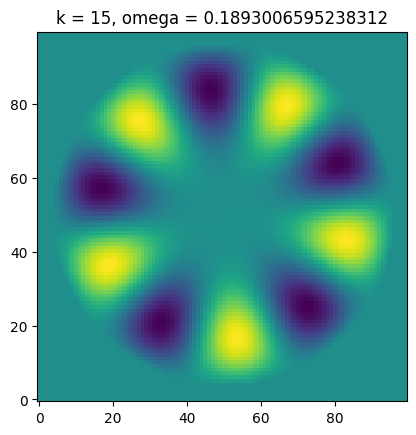

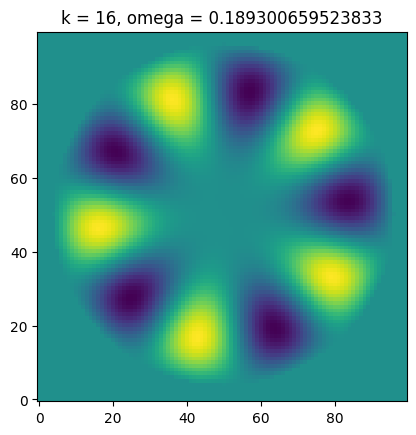

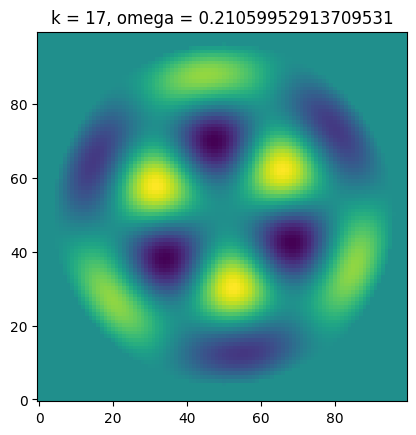

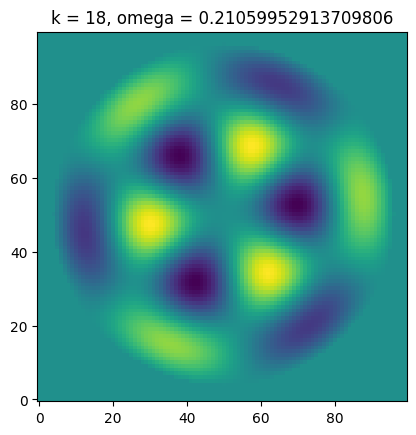

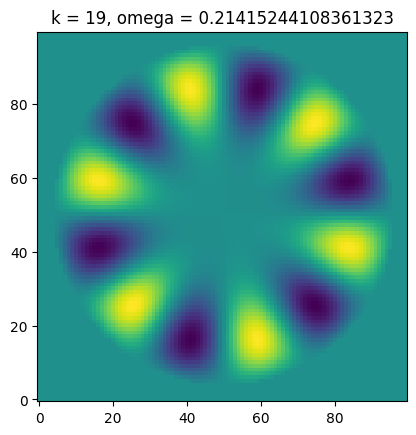

In [83]:
M, Proj_a_sparse = Delta_masked_Dirichlet(L,mask) 
w,v = splinalg.eigsh(M,k=20,which='SA')
for k in range(20):
    plt.imshow(Proj_a_sparse.T.dot(v[:,k]).reshape(L,L),origin='lower')
    plt.title('k = ' + str(k)+ ', omega = ' + str(np.sqrt(w[k])) )
    plt.show()

## Heat equation
### One dimension
$$ \partial_{t}\, u(t,x) - \partial_x^2 \,u(t,x) = 0 \; , $$
where $u(t,x)$ depends on the space and time and is proportional to the temperature. The heat current is given by the equation
$j(x,t) = - \partial_x \, u(t,x)$. The domain of the system is the interval: $x \in (0, L)$.
### Initial and boundary values
* Initial values: at $t=0$, $u(t=0,x)$ is known. The initial temperature distribution.
* Boundary conditions:
  - Dirichlet: The temperature is known at the boundaries: $u(t,0)$ and $u(t,L)$ are given
  - Neumann: The heat current is known at the boundaries: $\partial_x \, u(t,0)$ and $\partial_x \, u(t,L)$ are given.
 
### Discretization both in time and space
* The two derivatives:
 * $\partial_{t} \, u(t,x) \rightarrow \frac{u(t_{i+1},x_{m}) - u(t_{i},x_m)}{\Delta t} + O(\Delta t)$
 * $\partial_{x}^2 \, u(t,x) \rightarrow \frac{u(t_{i},x_{m+1}) + u(t_{i},x_{m-1}) - 2 u(t_{i},x_{m})}{\Delta x^2} + O(\Delta x^2)$
 * Note: The derivation in time is first order in space it is second order.
* The solution is to solve the equation in space for each timestep and proceed accordingly
$$u(t_{i+1},x_{m}) = u(t_{i},x_{m}) + \Delta t \frac{u(t_{i},x_{m+1}) + u(t_{i},x_{m-1}) - 2 u(t_{i},x_{m})}{\Delta x^2}$$
* The initial values are fixed by $u(t=0,x)$
* The boundary conditions will be set as earlier for the laplace equation

In [95]:
def heat_eq_dirichlet(dx,                    # x step
                      dt,                    # t timestep
                      Nstep,                 # Number of timesteps
                      u_init,                # initial heat profile
                      u_left_boundary,       # boundary value on the left side (Dirichlet)
                      u_right_boundary,      # boundary value on the right side (Dirichlet)
                      n_stored = 100):       # number of stored snapshots

    Nsite = u_init.shape[0] + 2      # Two sites are added to the domain to fix the boundary conditions
    u = np.zeros(Nsite)              # reserve space
    u[0] = u_left_boundary           # boundary value on the left side
    u[-1] = u_right_boundary         # boundary value on the right side
    u[1:(Nsite-1)] = u_init          # initial heat profile
    t = 0.0                          # starting time
    snapshot_step = Nstep // n_stored    #the snapshot frequenct 
    u_stored = np.zeros((n_stored,Nsite-2),dtype=float) # The array for the snapshots
    t_stored = np.zeros(n_stored,dtype=float) # The array for the time values
    u_stored[0] = np.copy(u[1:(Nsite-1)])
    t_stored[0] = t

    
    for i in range(1,Nstep):
        t = t + dt
        u[1:(Nsite-1)] = u[1:(Nsite-1)] + dt/dx**2 * (u[2:Nsite] + u[0:(Nsite-2)] - 2*u[1:(Nsite-1)])
        # The boundary sites are not changed
    
        if i % snapshot_step == 0: # save a snapshot
            u_stored[i//snapshot_step] = np.copy(u[1:(Nsite-1)])
            t_stored[i//snapshot_step] = t
    return t_stored, u_stored
    

In [77]:
# Simulation parameters
Nsite = 400
dx = 0.1
L=Nsite*dx
Nstep = 100000
dt = 0.001

# initial and boundary conditions
u_init = np.zeros(Nsite)
u_init[Nsite//2] = 1.0
u_left_boundary = 0.
u_right_boundary = 0.


t_stored, u_stored = heat_eq_dirichlet(dx = dx,                    
                                       dt = dt,                    
                                       Nstep = Nstep,                 
                                       u_init = u_init,                
                                       u_left_boundary = u_left_boundary,       
                                       u_right_boundary = u_right_boundary)


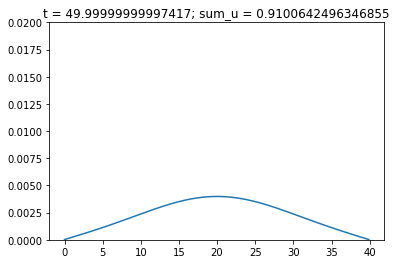

In [6]:
i = 50
t = t_stored[i]
plt.plot(np.arange(0,L,dx),u_stored[i])
plt.title('t = '+ str(t)+ '; sum_u = ' + str(np.sum(u_stored[i])) )
plt.ylim(0.,0.02)
plt.show()



In [5]:
def funcplot_animation(xpoints,ypoints_list,ylim,skip=1,frames=99,interval=100):
    fig = plt.figure(figsize=(5,3))
    ax = fig.add_subplot(111)
    ax.set_xlim([xpoints[0],xpoints[-1]])
    ax.set_ylim(ylim)
    line, = plt.plot([], [])
    def idraw(i):
        line.set_xdata(xpoints)
        line.set_ydata(ypoints_list[i*skip])
        return line,

    rc('animation', html='jshtml')
    return animation.FuncAnimation(fig, idraw, frames=frames, interval=interval, blit=True)

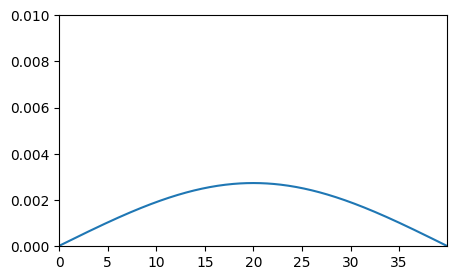

In [9]:
funcplot_animation(xpoints=np.arange(0,L,dx),
                   ypoints_list=u_stored,
                   ylim=[0.,0.01],
                   frames=len(u_stored))

### Alternative representation
Two dimensional plot one direction is $x$ other is $t$

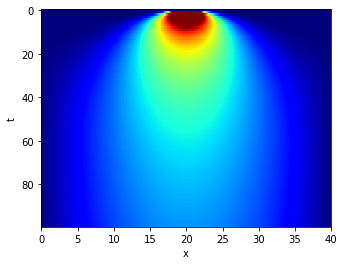

In [78]:
plt.imshow(u_stored,vmax=0.01,aspect=3,cmap='jet')
plt.xticks(np.arange(0,401,50),np.arange(0,41,5))
plt.xlabel('x')
plt.ylabel('t')
plt.show()

## Stability analysis
Let us change $dt$.
Condition: $dt<(dx)^2/2$

In [75]:
Nsite = 400
dx = .01414
L=Nsite*dx
Nstep = 10000
dt = 0.0001


u_init = np.zeros(Nsite)
u_init[Nsite//2] = 1.0
u_left_boundary = 0.
u_right_boundary = 0.


t_stored, u_stored = heat_eq_dirichlet(dx = dx,                    
                                       dt = dt,                    
                                       Nstep = Nstep,                 
                                       u_init = u_init,                
                                       u_left_boundary = u_left_boundary,       
                                       u_right_boundary = u_right_boundary)

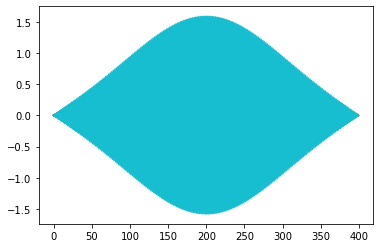

In [76]:
plt.plot(u_stored.T);

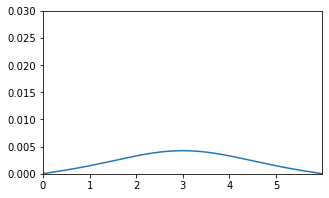

In [61]:
funcplot_animation(xpoints=np.arange(0,L,dx),
                   ypoints_list=u_stored,
                   ylim=[0.,0.03],
                   frames=len(u_stored))

## Neumann boundary conditions
Let us set: $\partial_{x} u(t,0) = \partial_x u(t,L) = 0.0$

In [79]:
def heat_eq_neumann(dx,                    # x step
                    dt,                    # t timestep
                    Nstep,                 # Number of timesteps
                    u_init,                # initial heat profile
                    dudx_left_boundary,    # boundary value on the left side (Neumann)
                    dudx_right_boundary,   # boundary value on the right side (Neumann)
                    n_stored = 100):       # number of stored snapshots

    Nsite = u_init.shape[0] + 2      # Two sites are added to the domain to fix the boundary conditions
    u = np.zeros(Nsite)              # reserve space
    u[0] = u[1] - dudx_left_boundary*dx           # boundary value on the left side
    u[-1] = u[-2] + dudx_right_boundary*dx         # boundary value on the right side
    u[1:(Nsite-1)] = u_init          # initial heat profile
    t = 0.0                          # starting time
    snapshot_step = Nstep // n_stored    #the snapshot frequenct 
    u_stored = np.zeros((n_stored,Nsite-2),dtype=float) # The array for the snapshots
    t_stored = np.zeros(n_stored,dtype=float) # The array for the time values
    u_stored[0] = np.copy(u[1:(Nsite-1)])
    t_stored[0] = t

    
    for i in range(1,Nstep):
        t = t + dt
        u[1:(Nsite-1)] = u[1:(Nsite-1)] + dt/dx**2 * (u[2:Nsite] + u[0:(Nsite-2)] - 2*u[1:(Nsite-1)])
        u[0] = u[1] - dudx_left_boundary*dx           # update left boundary
        u[-1] = u[-2] + dudx_right_boundary*dx        # update right boundary
    
        if i % snapshot_step == 0: # save a snapshot
            u_stored[i//snapshot_step] = np.copy(u[1:(Nsite-1)])
            t_stored[i//snapshot_step] = t
    return t_stored, u_stored
    

In [80]:
# Simulation paraameters
Nsite = 400
dx = 0.1
L=Nsite*dx
Nstep = 100000
Nstored = 100
dt = 0.001

# Initial and boundary values
u_init = np.zeros(Nsite)
u_init[Nsite//2] = 1
dudx_left_boundary = 0
dudx_right_boundary =  0

t_stored, u_stored = heat_eq_neumann(dx = dx,                    
                                       dt = dt,                    
                                       Nstep = Nstep,                 
                                       u_init = u_init,                
                                       dudx_left_boundary = dudx_left_boundary,       
                                       dudx_right_boundary = dudx_right_boundary)

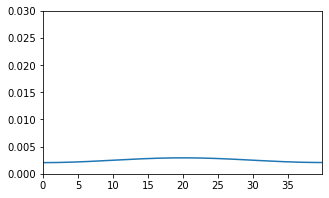

In [81]:
funcplot_animation(xpoints=np.arange(0,L,dx),
                   ypoints_list=u_stored,
                   ylim=[0.,0.03],
                   frames=len(u_stored))

## Total heat 
Let us measure the total heat in both cases:
$$Q_{tot} = \int_0^L  u(t,x)dx$$

In [87]:
# Simulation parameters
Nsite = 400
dx = 0.1
L=Nsite*dx
Nstep = 100000
dt = 0.001

# initial and boundary conditions
u_init = np.zeros(Nsite)
u_init[Nsite//2] = 1.0
u_left_boundary = 0.
u_right_boundary = 0.


t_stored, u_stored = heat_eq_dirichlet(dx = dx,                    
                                       dt = dt,                    
                                       Nstep = Nstep,                 
                                       u_init = u_init,                
                                       u_left_boundary = u_left_boundary,       
                                       u_right_boundary = u_right_boundary)


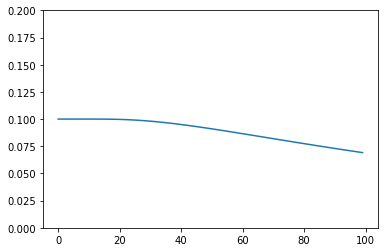

In [88]:
Q_tot = [];
for i in range(len(u_stored)):
    Q_tot.append(dx*np.sum(u_stored[i]));
plt.plot(t_stored,Q_tot);
plt.ylim([0,0.2])
plt.show()

In [89]:
# Simulation paraameters
Nsite = 400
dx = 0.1
L=Nsite*dx
Nstep = 100000
Nstored = 100
dt = 0.001

# Initial and boundary values
u_init = np.zeros(Nsite)
u_init[Nsite//2] = 1
dudx_left_boundary = 0
dudx_right_boundary =  0

t_stored, u_stored = heat_eq_neumann(dx = dx,                    
                                       dt = dt,                    
                                       Nstep = Nstep,                 
                                       u_init = u_init,                
                                       dudx_left_boundary = dudx_left_boundary,       
                                       dudx_right_boundary = dudx_right_boundary)

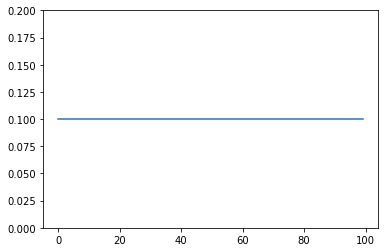

In [90]:
Q_tot = [];
for i in range(len(u_stored)):
    Q_tot.append(dx*np.sum(u_stored[i]));
plt.plot(t_stored,Q_tot);
plt.ylim([0,0.2])
plt.show()

## Solution in Fourier space
The FFT of numpy is the following
$$A_q = \sum_{m=0}^{n-1} a_m \; \exp \left( - 2\pi i \frac{m q}{n} \right) \; , \quad q \in \lbrace 0 \dots n-1 \rbrace$$
Inverse FFT:
$$a_m = \frac{1}{n} \sum_{q=0}^{n-1} A_k \; \exp \left( 2\pi i \frac{m q}{n} \right) \; , \quad m \in \lbrace 0 \dots n-1 \rbrace$$

The relation between the position ($x$) and the wave number ($k$):
$$\begin{align}
x& = m \Delta x\\
k& = \frac{2 \pi}{\Delta x} \frac{q}{n}
\end{align}$$
The transformation:
$$u(t,x) = \sum_{k} \hat{u}(t,k) \; \exp ( i k x ) $$

The heat equation
$$0 = \partial_t u(t,x) - \partial_x^2 u(t,x) = \sum_{k} \left( \partial_t \hat{u}(t,k) + k^2 \hat{u}(t,k) \right) \exp \lbrace i k x \rbrace$$

For all wave number we have a separate equation
$$ \partial_t \hat{u}(t,k) + k^2 \hat{u}(t,k) \ = 0  \quad \forall k$$

In Fourier space we have to solve a set of algebraic equations instead of the differential one.

Boundary conditions are more complicated....

In [2]:
def heat_eq_fft(dx,                    # x step
                dt,                    # t timestep
                Nstep,                 # Number of timesteps
                u_init,                # initial heat profile
                n_stored = 100):       # number of stored snapshots

    Nsite = u_init.shape[0]          # There are no extra boundary sites this time
    u = np.copy(u_init)              # initial heat profile
    u_fft = np.fft.fft(u)            # Fourier transform of the initial condition
    snapshot_step = Nstep // n_stored    #the snapshot frequenct 
    t = 0.0
    k = np.fft.fftfreq(Nsite, d=dx) * 2 * np.pi
    k_squares = k*k
    
    u_stored = np.zeros((n_stored,Nsite),dtype=float) # The array for the snapshots
    t_stored = np.zeros(n_stored,dtype=float) # The array for the time values
    u_stored[0] = np.copy(u)
    t_stored[0] = t

    
    for i in range(1,Nstep):
        t = t + dt
        u_fft = u_fft - dt*k_squares*u_fft

    
        if i % snapshot_step == 0: # save a snapshot
            u_stored[i//snapshot_step] = np.fft.ifft(u_fft)
            t_stored[i//snapshot_step] = t
    return t_stored, u_stored
    

In [3]:
# Simulation parameters
Nsite = 400
dx = 0.1
L=Nsite*dx
Nstep = 100000
Nstored = 100
dt = 0.0001

# initial and boundary values
u_init = np.zeros(Nsite)
u_init[Nsite//5] = 1.0


t_stored, u_stored = heat_eq_fft(dx = dx,                    
                                 dt = dt,                    
                                 Nstep = Nstep,                 
                                 u_init = u_init)

<ipython-input-2-0192f1ccdcf0>:27: ComplexWarning: Casting complex values to real discards the imaginary part
  u_stored[i//snapshot_step] = np.fft.ifft(u_fft)


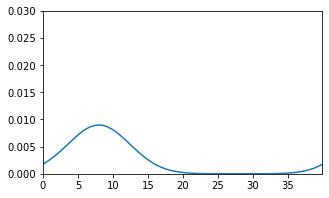

In [6]:
funcplot_animation(xpoints=np.arange(0,L,dx),
                   ypoints_list=u_stored,
                   ylim=[0.,0.03],
                   frames=len(u_stored))

### Problem: discrete space

#### Solution finite difference:
$$ \partial_x^2(u(t,x)) \approx \frac{u(t,x+\Delta x) + u(t,x- \Delta x) - 2 u (t,x)}{\Delta x^2} = \sum_{k} \frac{2 \cos(k \Delta x) -2}{\Delta x^2} \hat{u}{(t,k)} \exp (i k x)$$

In [28]:
def heat_eq_fft_stable(dx,                    # x step
                       dt,                    # t timestep
                       Nstep,                 # Number of timesteps
                       u_init,                # initial heat profile
                       n_stored = 100):       # number of stored snapshots

    Nsite = u_init.shape[0]          # There are no extra boundary sites this time
    u = np.copy(u_init)              # initial heat profile
    u_fft = np.fft.fft(u)            # Fourier transform of the initial condition
    snapshot_step = Nstep // n_stored    #the snapshot frequenct 
    t = 0.0
    k = np.fft.fftfreq(Nsite, d=dx) * 2 * np.pi
    k_factor = (2*np.cos(k*dx)-2.)/dx**2   # approximation of the second derivate
    
    u_stored = np.zeros((n_stored,Nsite),dtype=float) # The array for the snapshots
    t_stored = np.zeros(n_stored,dtype=float) # The array for the time values
    u_stored[0] = np.copy(u)
    t_stored[0] = t

    
    for i in range(1,Nstep):
        t = t + dt
        u_fft = u_fft + dt*k_factor*u_fft

    
        if i % snapshot_step == 0: # save a snapshot
            u_stored[i//snapshot_step] = np.real(np.fft.ifft(u_fft))
            t_stored[i//snapshot_step] = t
    return t_stored, u_stored
    

In [29]:
# simulation parameters
Nsite = 400
dx = 0.1
L=Nsite*dx
Nstep = 100000
Nstored = 100
dt = 0.001

# initial and boundary values
u_init = np.zeros(Nsite)
u_init[Nsite//2] = 1.0


t_stored, u_stored = heat_eq_fft_stable(dx = dx,                    
                                 dt = dt,                    
                                 Nstep = Nstep,                 
                                 u_init = u_init)

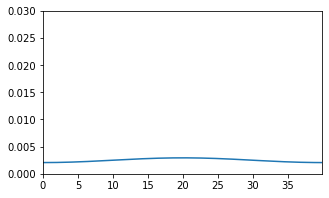

In [30]:
funcplot_animation(xpoints=np.arange(0,L,dx),
                   ypoints_list=u_stored,
                   ylim=[0.,0.03],
                   frames=len(u_stored))

### What are the boundary conditions
* $e^{i k x}$ is periodic for the given $k$ values $x \rightarrow x + L$ periodic.
* We used periodic functions to express the solution so the resut satisfies the the periodic bounday conditions